Ten notebook służył do znalezienia w sbiorze danych hyper-gastro w kategorii unlabeled
obrazków możliwie podobnych do polyps, żeby mieć 1000 przykładów bez polipów.
Zostało wybrane ~1200 i ręcznie przejrzano i usunięto te, które zawierały polipy.

In [1]:
import os
import warnings
from pathlib import Path
from typing import Callable
from typing_extensions import override

import torch
import torch.nn as nn
import torch.utils.data
# import torch.optim as optim
# from torch.optim import lr_scheduler
# import torch.backends.cudnn as cudnn
import numpy as np
import torchvision
import matplotlib.pyplot as plt


while os.path.basename(os.getcwd()) != "T2T_ViT":
    os.chdir('..')


%env CUDA_VISIBLE_DEVICES=7
# if torch.cuda.device_count() > 1:
#     torch.cuda.set_device(7)
# Silence TensorFlow warnings, we only use it for logging.
%env TF_CPP_MIN_LOG_LEVEL=2
# Silence PyTorch Lightning warnings about not using slurm.
from lightning_fabric.utilities.warnings import PossibleUserWarning

warnings.simplefilter("ignore", category=PossibleUserWarning)
# %env SLURM_NTASKS=1

env: CUDA_VISIBLE_DEVICES=7
env: TF_CPP_MIN_LOG_LEVEL=2


In [4]:
import random
from collections import namedtuple
from functools import partial

import PIL
import torchvision.datasets.folder
import torchvision.models
from torchvision.transforms import v2

ImageWithLabel = namedtuple("ImageWithLabel", ["image", "label"])

class GastroDataset(torch.utils.data.Dataset):
    """

    Yields CHW float 0..1 RGB images (if using the default transform ) and labels.
    """
    # Or you could just organize folders normally and use torchvision.datasets.ImageFolder...

    label_names = ["normal", "polyp"]
    name_to_label = {name: label for label, name in enumerate(label_names)}
    image_size = 224
    default_transform = v2.Compose([
        v2.PILToTensor(),
        v2.Resize([image_size], antialias=True),  # resize while keeping aspect ratio, so that min dimension is image_size.
        v2.CenterCrop(image_size),  # crop rectangle centrally to square.
        # v2.Resize([image_size - 1], max_size=image_size),  # resize while keeping aspect ratio, so that max dimension is image_size.
        # v2.CenterCrop(image_size),  # pad to square with zeroes.
        v2.ToDtype(torch.float32, scale=True),  # convert to float and scale to 0..1.
        partial(torchvision.transforms.functional.erase, i=image_size - 80, j=0, h=80, w=70, v=0),  # erase the green position visualization that appears on some images.
        v2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    default_train_transform = v2.Compose([
        v2.PILToTensor(),
        v2.Resize([2 * image_size], antialias=True),  # resize while keeping aspect ratio, so that min dimension is image_size.
        v2.CenterCrop(2 * image_size),  # crop rectangle centrally to square.
        partial(torchvision.transforms.functional.erase, i=2*(image_size - 80), j=0, h=2 * 80, w=2 * 70, v=0),  # erase the green position visualization that appears on some images.
        v2.RandomResizedCrop([224], scale=(0.7, 1.0), ratio=(0.9, 1.1), antialias=True),
        lambda img: v2.FiveCrop(size=(120, 120))(img)[0] if random.random() > 0.5 else v2.FiveCrop(size=(120, 120))(img)[3],
        v2.RandomHorizontalFlip(0.5),
        v2.RandomRotation(180),
        v2.RandomAutocontrast(p=0.5),
        v2.RandomEqualize(0.5),
        v2.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2),
        v2.RandomPosterize(bits=3, p=0.5),
        v2.RandomAdjustSharpness(sharpness_factor=2, p=0.5),
        v2.ToDtype(torch.float32, scale=True),  # convert to float and scale to 0..1.
        v2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    # torchvision.models.ResNet18_Weights.IMAGENET1K_V1.transforms(antialias=True)

    def __init__(
        self,
        root: str|Path,
        transform: Callable[[PIL.Image.Image], torch.Tensor]|None = None
    ) -> None:
        self.root = Path(root).expanduser()
        self.transform = transform or self.default_transform
        # self.transform = torch.jit.script(self.transform)

        dirs = {
            self.root / "hyper-kvasir/segmented-images/images": "polyp",
            self.root / "hyper-kvasir/unlabeled-images-subset/images": "normal"
        }

        self.dataitems = list[tuple[Path, int]]()
        for d, label_name in dirs.items():
            label = self.name_to_label[label_name]
            for p in sorted(d.glob("**/*.jpg")):
                self.dataitems.append((p, label))

    @override
    def __getitem__(self, index: int) -> ImageWithLabel:
        image_path, label = self.dataitems[index]
        pil_image = torchvision.datasets.folder.default_loader(image_path)
        # or torchvision.io.read_image(image_path) but then without pil_to_tensor?
        image_tensor = self.transform(pil_image)
        return ImageWithLabel(image=image_tensor, label=label)

    @override
    def __len__(self) -> int:
        return len(self.dataitems)


2396 images
torch.Size([3, 120, 120]) torch.float32 tensor(-2.1179) tensor(2.6051) 0


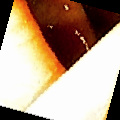

In [3]:
def foo():
    dataset = GastroDataset("gastro/", transform=GastroDataset.default_train_transform)
    print(len(dataset), "images")
    image, label = dataset[1300]
    print(image.shape, image.dtype, image.min(), image.max(), label)
    mean = torch.Tensor([0.485, 0.456, 0.406]).unsqueeze(-1).unsqueeze(-1)
    std = torch.Tensor([0.229, 0.224, 0.225]).unsqueeze(-1).unsqueeze(-1)
    display(v2.ToPILImage()((image * std) + mean))
foo()

In [4]:
from pytorch_lightning import LightningDataModule, LightningModule, Trainer
from typing import Any

class GastroDataModule(LightningDataModule):
    def __init__(self, batch_size: int = 128):
        super().__init__()
        self.batch_size = batch_size
        self.dataloader_kwargs = dict(
            batch_size=self.batch_size,
            num_workers=8,
            pin_memory=True
        )

    def setup(self, stage: str = None) -> None:
        generator = torch.Generator().manual_seed(42)
        full_dataset = GastroDataset("gastro/")
        self.train_dataset, self.val_dataset = torch.utils.data.random_split(full_dataset, [0.7, 0.3], generator=generator)
        self.train_dataset.dataset = GastroDataset("gastro/", transform=GastroDataset.default_train_transform)
        self.test_dataset = self.val_dataset

    def train_dataloader(self) -> torch.utils.data.DataLoader:
        return torch.utils.data.DataLoader(self.train_dataset, **self.dataloader_kwargs, shuffle=True)

    def val_dataloader(self) -> torch.utils.data.DataLoader:
        return torch.utils.data.DataLoader(self.val_dataset, **self.dataloader_kwargs)

    def test_dataloader(self) -> torch.utils.data.DataLoader:
        return torch.utils.data.DataLoader(self.test_dataset, **self.dataloader_kwargs)

class ImagenetTransferLearning(LightningModule):
    def __init__(self, num_target_classes: int = 2):
        super().__init__()
        self.save_hyperparameters()

        self.model = torchvision.models.resnet18(weights=torchvision.models.ResNet18_Weights.IMAGENET1K_V1)
        n_head_in_features = self.model.fc.in_features
        self.model.fc = nn.Linear(in_features=n_head_in_features, out_features=num_target_classes)

        # self.model = torchvision.models.mobilenet_v3_small(weights=torchvision.models.MobileNet_V3_Small_Weights.IMAGENET1K_V1)
        # n_head_in_features = self.model.classifier[3].in_features
        # self.model.classifier[3] = nn.Linear(in_features=n_head_in_features, out_features=num_target_classes)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.model(x)

    def training_step(self, batch: ImageWithLabel, batch_idx: int) -> torch.Tensor:
        images, labels = batch
        logits = self(images)
        loss = nn.CrossEntropyLoss()(logits, labels)
        accuracy = (logits.argmax(dim=-1) == labels).float().mean()
        self.log("train/accuracy", accuracy, prog_bar=True)  # , on_step=False, on_epoch=True)
        self.log("train/loss", loss, prog_bar=True)
        return loss

    def validation_step(self, batch: ImageWithLabel, batch_idx: int) -> None:
        images, labels = batch
        logits = self(images)
        loss = nn.CrossEntropyLoss()(logits, labels)
        accuracy = (logits.argmax(dim=-1) == labels).float().mean()
        self.log("val/accuracy", accuracy, prog_bar=True)
        self.log("val/loss", loss, prog_bar=True)

    def test_step(self, batch: ImageWithLabel, batch_idx: int) -> None:
        images, labels = batch
        logits = self(images)
        accuracy = (logits.argmax(dim=-1) == labels).float().mean()
        self.log("test/accuracy", accuracy, prog_bar=True)

    def configure_optimizers(self) -> dict[str, Any]:
        optimizer = torch.optim.AdamW(self.parameters(), lr=0.001)
        scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)
        # optimizer = torch.optim.SGD(self.parameters(), lr=0.01, momentum=0.9)
        # scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        #     optimizer, mode='min', factor=0.05, patience=2, threshold=0.0001,
        #     threshold_mode='rel', cooldown=0, min_lr=0, eps=1e-08, verbose=True
        # )
        return {
            "optimizer": optimizer,
            "lr_scheduler": {
                "scheduler": scheduler,
                "monitor": "val/loss"
            }
        }


In [5]:
from pytorch_lightning.callbacks import RichProgressBar

torch.set_float32_matmul_precision("medium")
module = ImagenetTransferLearning()
datamodule = GastroDataModule()
trainer = Trainer(max_epochs=10, callbacks=RichProgressBar(leave=True,  console_kwargs=dict(width=250)), log_every_n_steps=2, accelerator="gpu")
trainer.fit(module, datamodule)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [7]


┏━━━┳━━━━━━━┳━━━━━━━━┳━━━━━━━━┓
┃   ┃ Name  ┃ Type   ┃ Params ┃
┡━━━╇━━━━━━━╇━━━━━━━━╇━━━━━━━━┩
│ 0 │ model │ ResNet │ 11.2 M │
└───┴───────┴────────┴────────┘

Trainable params: 11.2 M                                                                                           
Non-trainable params: 0                                                                                            
Total params: 11.2 M                                                                                               
Total estimated model params size (MB): 44

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

`Trainer.fit` stopped: `max_epochs=10` reached.


In [6]:
test_dataset = torchvision.datasets.ImageFolder("gastro/hyper-kvasir/unlabeled-images", transform=GastroDataset.default_transform)
test_dataset.samples = test_dataset.samples[:2000]
test_datamodule = torch.utils.data.DataLoader(test_dataset, num_workers=8, batch_size=100, pin_memory=True)

model = module.model.eval().cuda()
for images, labels in test_datamodule:
    with torch.no_grad():
        logits = model(images.cuda())
        print(logits[:, 1].min().item(), logits[:, 1].max().item())


-3.030085802078247 0.24995896220207214
-3.466339349746704 0.3469727337360382
-3.3548834323883057 0.7514205574989319
-3.497450113296509 0.48821768164634705
-3.0357370376586914 0.2707423269748688
-3.0101616382598877 0.40715426206588745
-2.8947346210479736 0.3208560049533844
-3.0755982398986816 0.4408571124076843
-3.565167188644409 0.9852707386016846
-3.1609890460968018 0.5771713852882385
-3.361442804336548 0.770842969417572
-3.05391526222229 0.49729129672050476
-3.5240538120269775 0.6298340559005737
-3.082368850708008 0.31808412075042725
-2.8653130531311035 0.28745558857917786
-2.7514164447784424 0.6742690801620483
-3.1779589653015137 0.5920910835266113
-3.43449068069458 0.3433215916156769
-3.224151372909546 0.8365371227264404
-3.1920652389526367 0.2822975516319275


In [11]:
from tqdm import tqdm

polyp_probs = dict[str, float]()
for p in tqdm(sorted(Path("gastro/hyper-kvasir/unlabeled-images").glob("**/*.jpg"))[:]):
    image = torchvision.datasets.folder.default_loader(p)
    image_tensor = GastroDataset.default_transform(image).unsqueeze(0).cuda()
    with torch.no_grad():
        logits = model(image_tensor)
        probs = torch.softmax(logits, dim=-1)
    polyp_probs[p.name] = probs[0, 1].item()

100%|██████████| 99417/99417 [19:08<00:00, 86.55it/s] 


In [1]:
print(sorted(polyp_probs.values(), reverse=True)[:10])

NameError: name 'polyp_probs' is not defined

In [14]:
import json

with open("polyp_probs.json", "w") as f:
    json.dump(polyp_probs, f)

In [5]:
import json
with open("polyp_probs.json") as f:
    polyp_probs = json.load(f)

In [7]:
import shutil
most_similar_to_polyp = sorted(polyp_probs, key=polyp_probs.get, reverse=True)[0:1500]
target_dir = Path("gastro/hyper-kvasir/unlabeled-images-similar2/images")
target_dir.mkdir(exist_ok=True, parents=True)
if False:
    for p in most_similar_to_polyp:
        shutil.copyfile(Path("gastro/hyper-kvasir/unlabeled-images/images") / p, target_dir / p)

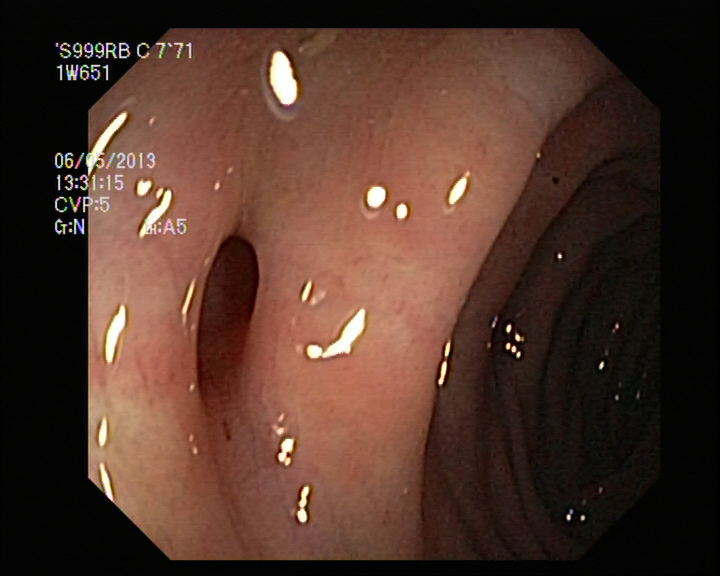

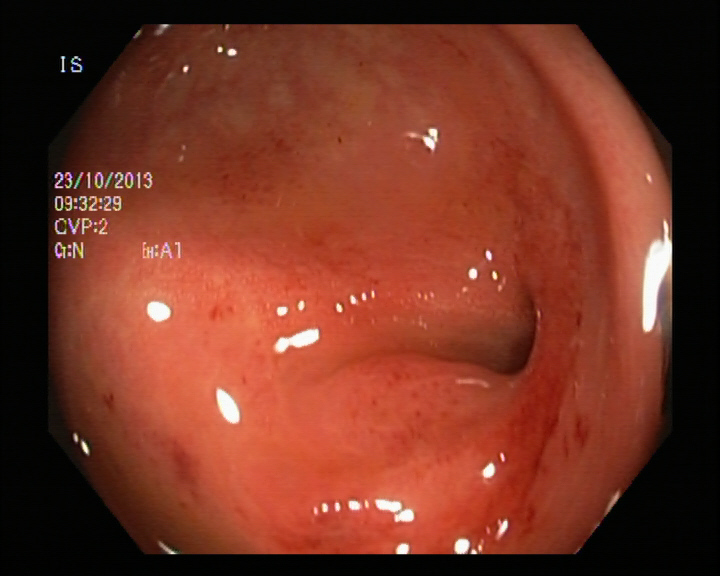

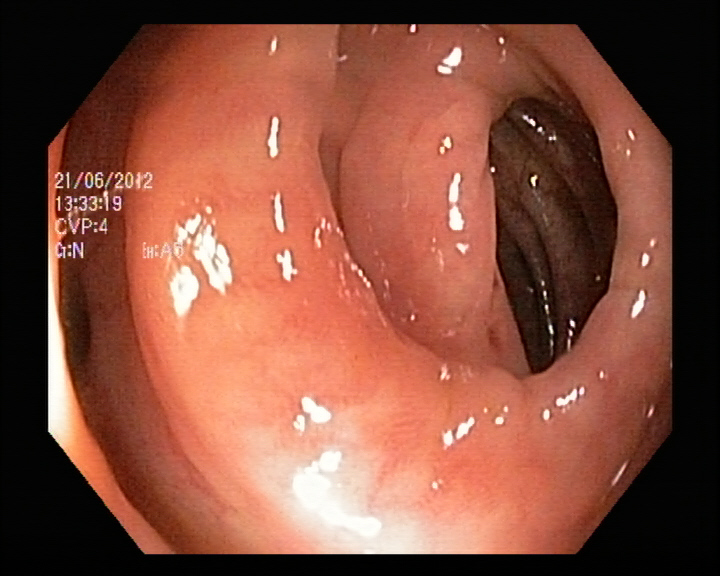

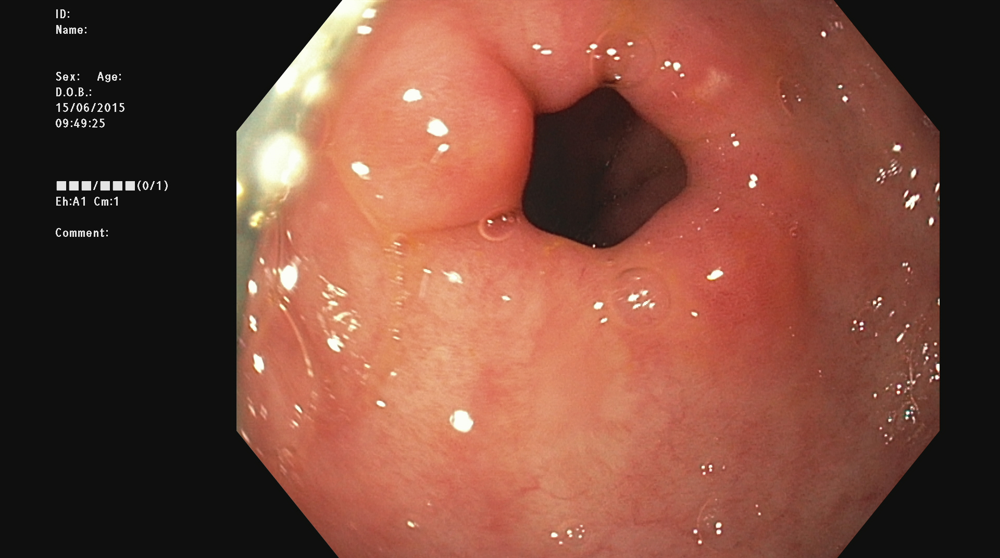

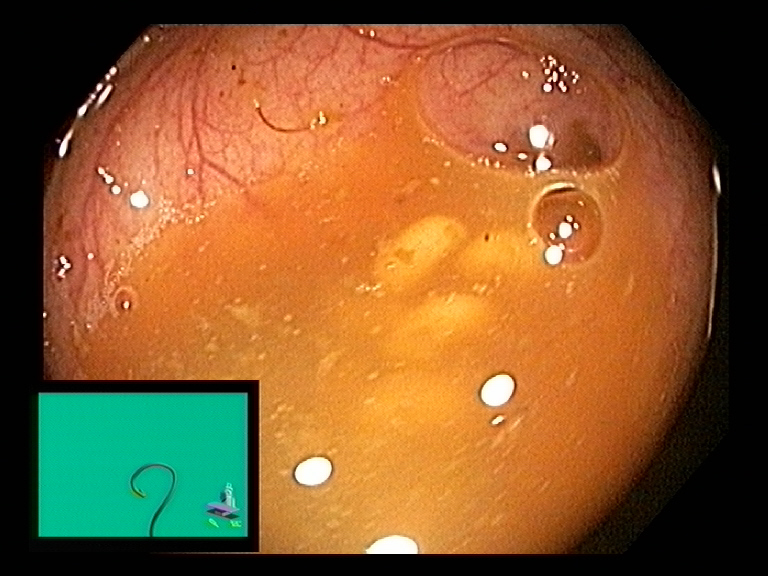

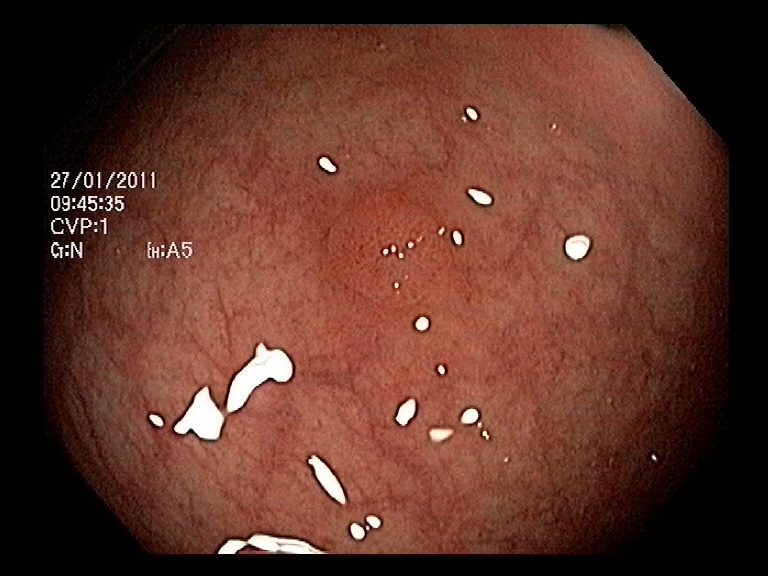

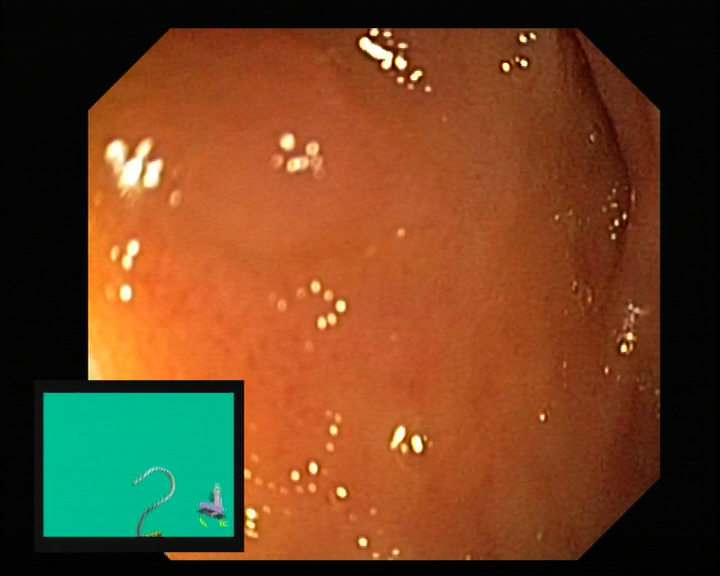

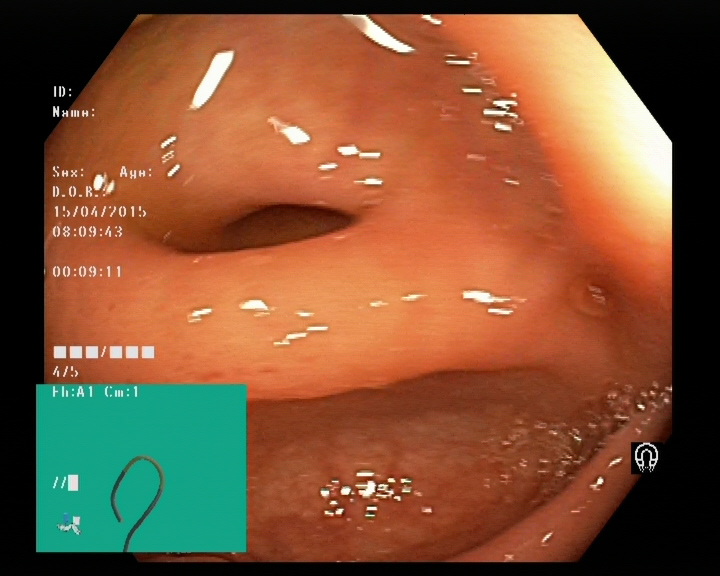

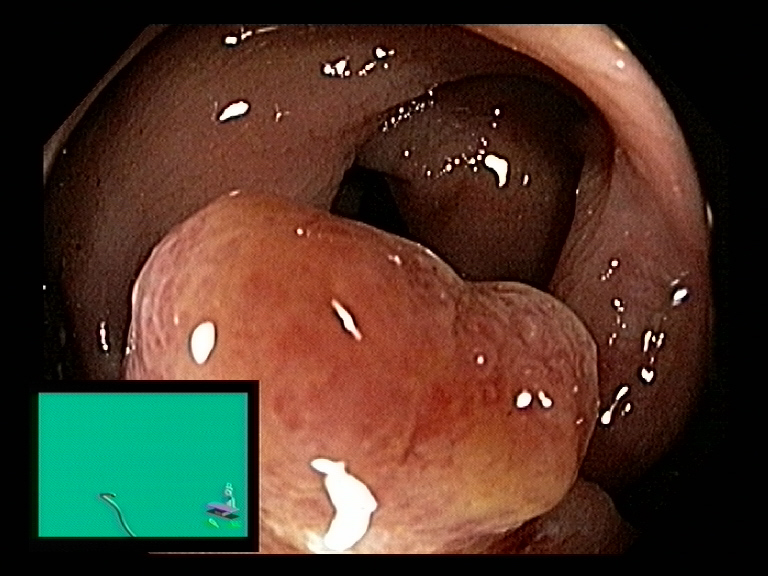

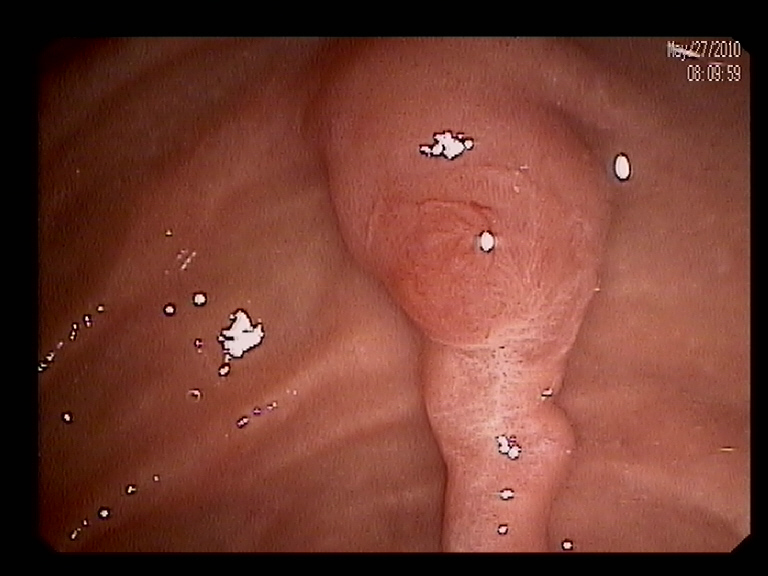

In [6]:
most_similar_to_polyp = sorted(polyp_probs, key=polyp_probs.get, reverse=True)[10:20]
for p in most_similar_to_polyp:
    display(PIL.Image.open(Path("gastro/hyper-kvasir/unlabeled-images/images") / p))